In [2]:
import tensorflow as tf
import keras
from keras import layers
import pickle
import numpy as np
import pandas as pd
import glob
import xarray as xr
from keras.models import load_model

from scipy.stats import norm
from scipy import stats
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import cartopy
import cartopy.crs as ccrs
import h5netcdf

import warnings
warnings.filterwarnings("ignore")
from alibi.explainers import IntegratedGradients, KernelShap
import os
import scipy as sp
import scipy.ndimage
from matplotlib.transforms import Bbox
import matplotlib.patches as patches

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

In [3]:
lat = np.arange(-90, 90, 180/192)
lon = np.arange(0, 360, 360/288)

lat_bnd1 = np.where(lat==10.3125)[0][0]
lat_bnd2 = np.where(lat==50.625)[0][0]
lon_bnd1 = np.where(lon==210)[0][0]
lon_bnd2 = np.where(lon==300)[0][0]

In [4]:
#set the base path 
base_path = '/sfs/weka/scratch/zkq5md'

#load the dataframe
df_se_era5 = pd.read_csv(f'{base_path}/Data/ERA5/Final/SE_detrend_precip.csv', index_col='Unnamed: 0')
df_gp_era5 = pd.read_csv(f'{base_path}/Data/ERA5/Final/GP_detrend_precip.csv', index_col='Unnamed: 0')
df_ca_era5 = pd.read_csv(f'{base_path}/Data/ERA5/Final/CA_detrend_precip.csv', index_col='Unnamed: 0')
df_se_era5

,Datetimes,Maximum Precipitation,lats,lons
0,1950-01-01,29.729749,32.8125,266.25
1,1950-01-02,39.121912,35.6250,270.00
2,1950-01-03,18.399313,35.6250,266.25
3,1950-01-04,59.563390,35.6250,267.50
4,1950-01-05,40.699897,35.6250,271.25
...,...,...,...,...
9977,2015-12-27,75.272000,34.6875,266.25
9978,2015-12-28,51.817838,35.6250,267.50
9979,2015-12-29,26.021470,34.6875,276.25
9980,2015-12-30,44.338429,30.9375,271.25


In [5]:
with open(f'{base_path}/Data/ERA5/Final/X_era5.pkl', "rb") as f:
    x = pickle.load(f)
    
x = np.transpose(np.array(x), (0, 2, 3, 1))

x = x[:, lat_bnd1:lat_bnd2, lon_bnd1:lon_bnd2, :]

x_test_era5 = x[8000:]

y_se_era5_test = df_se_era5.iloc[8000:]
y_gp_era5_test = df_gp_era5.iloc[8000:]
y_ca_era5_test = df_ca_era5.iloc[8000:]
df_se_era5 = y_se_era5_test.reset_index()
df_gp_era5 = y_gp_era5_test.reset_index()
df_ca_era5 = y_ca_era5_test.reset_index()


In [6]:
def get_gradients(inputs, model, top_pred_idx=None):
    """Computes the gradients of outputs w.r.t input image.

    Args:
        inputs: 2D/3D/4D matrix of samples
        top_pred_idx: (optional) Predicted label for the x_data
                      if classification problem. If regression,
                      do not include.

    Returns:
        Gradients of the predictions w.r.t img_input
    """
    inputs = tf.cast(inputs, tf.float32)

    with tf.GradientTape() as tape:
        tape.watch(inputs)
        
        # Run the forward pass of the layer and record operations
        # on GradientTape.
        preds = model(inputs, training=False)  
        
        # For classification, grab the top class
        if top_pred_idx is not None:
            preds = preds[:, top_pred_idx]
        
    # Use the gradient tape to automatically retrieve
    # the gradients of the trainable variables with respect to the loss.        
    grads = tape.gradient(preds, inputs)
    
    return grads

In [7]:
def get_integrated_gradients(inputs, model, baseline=None, num_steps=50, top_pred_idx=None):
    """Computes Integrated Gradients for a prediction.

    Args:
        inputs (ndarray): 2D/3D/4D matrix of samples
        baseline (ndarray): The baseline image to start with for interpolation
        num_steps: Number of interpolation steps between the baseline
            and the input used in the computation of integrated gradients. These
            steps along determine the integral approximation error. By default,
            num_steps is set to 50.
        top_pred_idx: (optional) Predicted label for the x_data
                      if classification problem. If regression,
                      do not include.            

    Returns:
        Integrated gradients w.r.t input image
    """
    # If baseline is not provided, start with zeros
    # having same size as the input image.
    if baseline is None:
        input_size = np.shape(inputs)[1:]
        baseline = np.zeros(input_size).astype(np.float32)
    else:
        baseline = baseline.astype(np.float32)

    # 1. Do interpolation.
    inputs = inputs.astype(np.float32)
    interpolated_inputs = [
        baseline + (step / num_steps) * (inputs - baseline)
        for step in range(num_steps + 1)
    ]
    interpolated_inputs = np.array(interpolated_inputs).astype(np.float32)

    # 3. Get the gradients
    grads = []
    for i, x_data in enumerate(interpolated_inputs):
        grad = get_gradients(x_data, model, top_pred_idx=top_pred_idx)     
        grads.append(grad)
    grads = tf.convert_to_tensor(grads, dtype=tf.float32)

    # 4. Approximate the integral using the trapezoidal rule
    grads = (grads[:-1] + grads[1:]) / 2.0
    avg_grads = tf.reduce_mean(grads, axis=0)
    # 5. Calculate integrated gradients and return
    integrated_grads = (inputs - baseline) * avg_grads
    
    return integrated_grads

In [8]:
def basic_map_details(ax, df, iloc, lats_lons):
    '''
    '''
    
    ax.plot(
        df.iloc[iloc].lons,
        df.iloc[iloc].lats,
        marker='o', color='yellow', markersize=10,
        transform=cartopy.crs.PlateCarree(), zorder=4
    )

    ax.add_feature(cartopy.feature.STATES, edgecolor='darkgrey', zorder=3)
    ax.add_feature(cartopy.feature.COASTLINE, zorder=3, edgecolor='darkgrey')
    ax.add_feature(cartopy.feature.LAND, facecolor='white', edgecolor='darkgrey')
    ax.set_extent(lats_lons)
    
    return ax

In [9]:
var_names = ['cwv', 'z500', 'tas']
names = ['tcwv', 'z', 't2m']
cmaps_raw = ['BrBG', 'coolwarm', 'gist_ncar']
variables = ['CWV', 'Z500', 'TAS']
info = ['Raw', 'Input', 'IG']

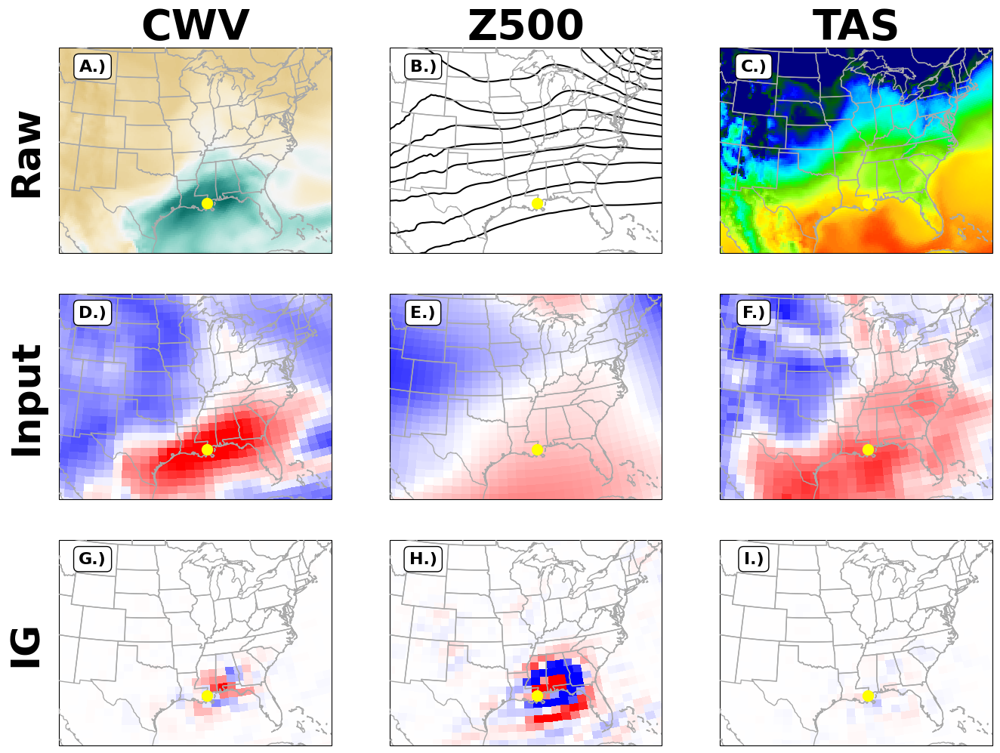

In [79]:
loc = 'se'
sample = 968
iloc = np.where(locals()[f'df_{loc}_era5']['index'] == locals()[f'df_{loc}_era5']['index'].loc[sample])[0][0]
dt_val = locals()[f'df_{loc}_era5'].iloc[iloc]["Datetimes"]

fig = plt.figure(figsize=(16, 12))

for i in range (9):

    ax = plt.subplot(3, 3, i+1, projection=ccrs.LambertConformal(central_longitude=-98, central_latitude=35))

    if i <= 2:
        with h5netcdf.File(
            f"/sfs/weka/scratch/zkq5md/Data/ERA5/era5_{var_names[i]}_{dt_val[:4]}.nc", "r") as f:

            vals = f[names[i]][:]
            valid_times = f['valid_time'][:]
            datetimes = pd.to_datetime(valid_times, unit='s', origin='1970-01-01')
            lats_era = f['latitude'][:]
            lons_era = f['longitude'][:]
            doy_index = np.where(datetimes == pd.to_datetime(dt_val))[0][0]
            #vals = vals[doy_index-1]
            vals = vals[doy_index+1]

            if vals.shape != (721, 1440):
                ax.contour(lons_era, lats_era, vals[0],
                           transform=cartopy.crs.PlateCarree(),
                           colors='k', lw=100,
                           levels=np.arange(vals[0].min(), vals[0].max(), 600))
            else:
                c = ax.pcolormesh(lons_era, lats_era, vals,
                                  transform=cartopy.crs.PlateCarree(),
                                  cmap=cmaps_raw[i],
                                  vmax=[50, 0, 313, 0.011][i], vmin=[-20, 0, 263, 0][i])
            ax.set_title(f'{variables[i]}', fontsize=40, fontweight='bold')

    elif i >= 6:
        model_list = glob.glob(
                    f'{base_path}/Data/ERA5/models/trans_learn/pre/{loc}_max_precip_mse_model*')
        itgs = []

        for model_path in model_list:
            model = load_model(f"{model_path}", safe_mode=False)
    
            IntegratedGrad = get_integrated_gradients(np.expand_dims(x_test_era5[sample], 0)
                                                      , model).numpy()
            itgs.append(IntegratedGrad[0])


        vals = np.mean(np.array(itgs)[:, :, :, i%3], axis=0)
        c = ax.pcolormesh(lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
                          transform=cartopy.crs.PlateCarree(), cmap='bwr', vmin=-5, vmax=5)

    else:
        vals = x_test_era5[sample, :, :, i%3]
        c = ax.pcolormesh(
            lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
            transform=cartopy.crs.PlateCarree(),
            cmap='bwr', vmin=-2, vmax=2)
        
    ax = basic_map_details(ax, locals()[f'df_{loc}_era5'], iloc, [-110, -74, 23.5, 47.5])
    abc = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P']
    ax.annotate(f'{abc[i]}.)', (0, 0), textcoords="offset points",  color='k', fontsize=16, xytext=(-55, 90), ha='center',
                     bbox=dict(boxstyle='round', facecolor='w', alpha=1), fontweight='bold')

    if i%3 == 0:
                ax.text(
                    -0.05, 0.5, f'{info[int(i/3)]}',
                    transform=ax.transAxes,
                    fontsize=37, fontweight='bold',
                    va='center', ha='right', rotation=90
                )


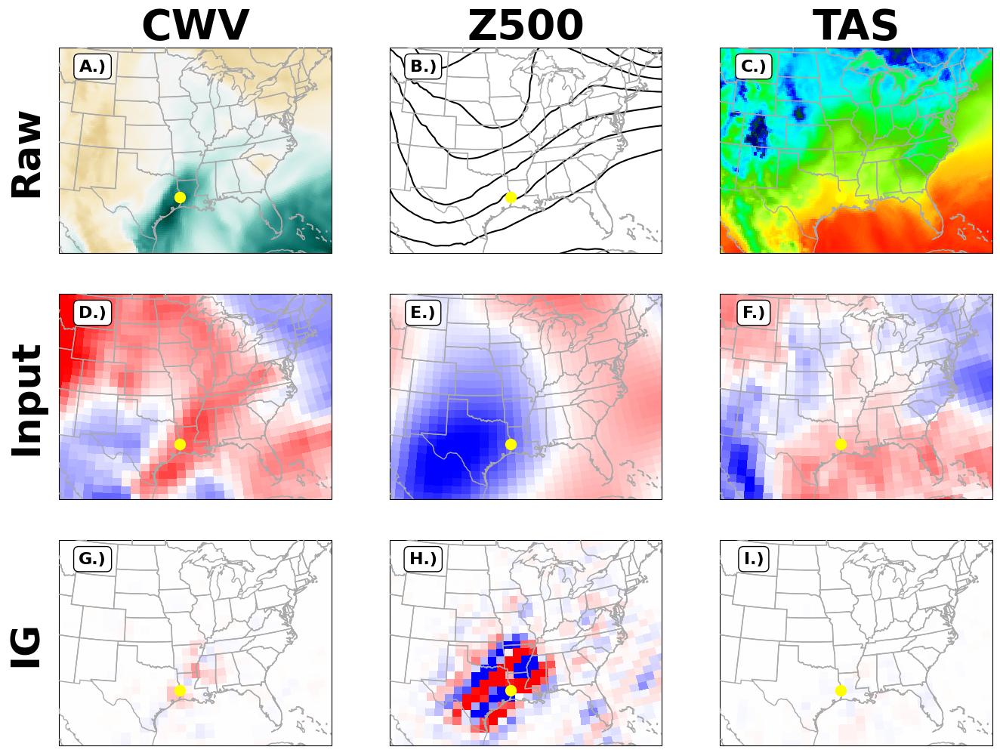

In [13]:
loc = 'se'
sample = 874
iloc = np.where(locals()[f'df_{loc}_era5']['index'] == locals()[f'df_{loc}_era5']['index'].loc[sample])[0][0]
dt_val = locals()[f'df_{loc}_era5'].iloc[iloc]["Datetimes"]

fig = plt.figure(figsize=(16, 12))

for i in range (9):

    ax = plt.subplot(3, 3, i+1, projection=ccrs.LambertConformal(central_longitude=-98, central_latitude=35))

    if i <= 2:
        with h5netcdf.File(
            f"/sfs/weka/scratch/zkq5md/Data/ERA5/era5_{var_names[i]}_{dt_val[:4]}.nc", "r") as f:

            vals = f[names[i]][:]
            valid_times = f['valid_time'][:]
            datetimes = pd.to_datetime(valid_times, unit='s', origin='1970-01-01')
            lats_era = f['latitude'][:]
            lons_era = f['longitude'][:]
            doy_index = np.where(datetimes == pd.to_datetime(dt_val))[0][0]
            #vals = vals[doy_index-1]
            vals = vals[doy_index+1]

            if vals.shape != (721, 1440):
                ax.contour(lons_era, lats_era, vals[0],
                           transform=cartopy.crs.PlateCarree(),
                           colors='k', lw=100,
                           levels=np.arange(vals[0].min(), vals[0].max(), 600))
            else:
                c = ax.pcolormesh(lons_era, lats_era, vals,
                                  transform=cartopy.crs.PlateCarree(),
                                  cmap=cmaps_raw[i],
                                  vmax=[50, 0, 313, 0.011][i], vmin=[-20, 0, 263, 0][i])
            ax.set_title(f'{variables[i]}', fontsize=40, fontweight='bold')

    elif i >= 6:
        model_list = glob.glob(
                    f'{base_path}/Data/ERA5/models/trans_learn/pre/{loc}_max_precip_mse_model*')
        itgs = []

        for model_path in model_list:
            model = load_model(f"{model_path}", safe_mode=False)
    
            IntegratedGrad = get_integrated_gradients(np.expand_dims(x_test_era5[sample], 0)
                                                      , model).numpy()
            itgs.append(IntegratedGrad[0])


        vals = np.mean(np.array(itgs)[:, :, :, i%3], axis=0)
        c = ax.pcolormesh(lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
                          transform=cartopy.crs.PlateCarree(), cmap='bwr', vmin=-5, vmax=5)

    else:
        vals = x_test_era5[sample, :, :, i%3]
        c = ax.pcolormesh(
            lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
            transform=cartopy.crs.PlateCarree(),
            cmap='bwr', vmin=-2, vmax=2)
        
    ax = basic_map_details(ax, locals()[f'df_{loc}_era5'], iloc, [-110, -74, 23.5, 47.5])
    abc = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P']
    ax.annotate(f'{abc[i]}.)', (0, 0), textcoords="offset points",  color='k', fontsize=16, xytext=(-55, 90), ha='center',
                     bbox=dict(boxstyle='round', facecolor='w', alpha=1), fontweight='bold')

    if i%3 == 0:
                ax.text(
                    -0.05, 0.5, f'{info[int(i/3)]}',
                    transform=ax.transAxes,
                    fontsize=37, fontweight='bold',
                    va='center', ha='right', rotation=90
                )

plt.savefig(f'xai_{loc}_{sample}.png', format='png', dpi=500, bbox_inches='tight')

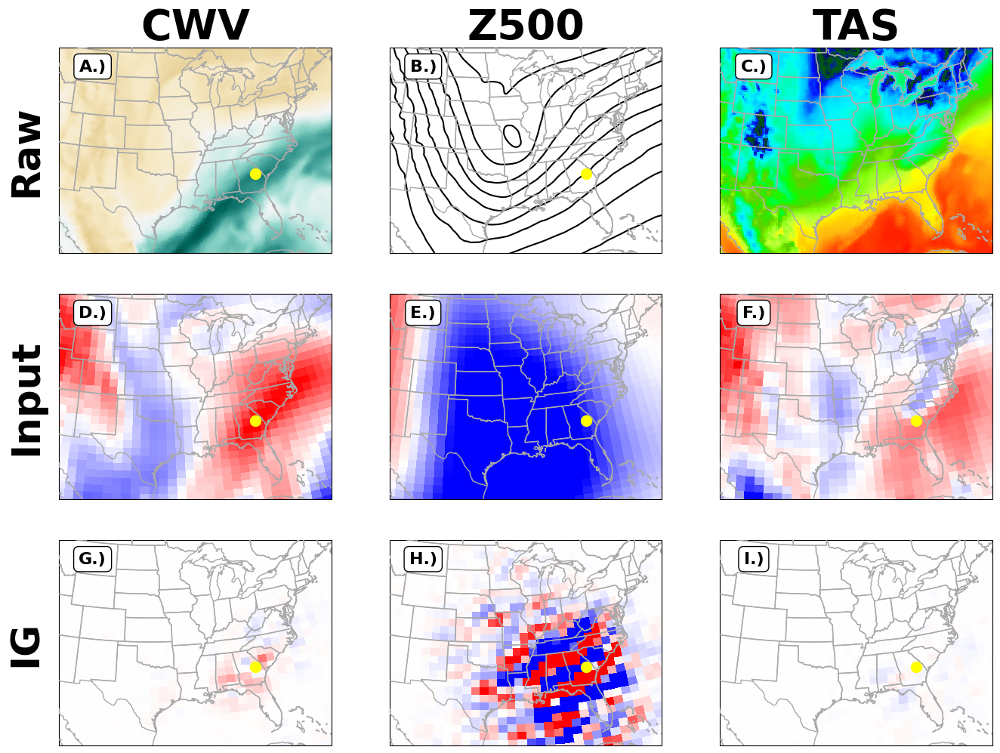

In [12]:
loc = 'se'
sample = 892
iloc = np.where(locals()[f'df_{loc}_era5']['index'] == locals()[f'df_{loc}_era5']['index'].loc[sample])[0][0]
dt_val = locals()[f'df_{loc}_era5'].iloc[iloc]["Datetimes"]

fig = plt.figure(figsize=(16, 12))

for i in range (9):

    ax = plt.subplot(3, 3, i+1, projection=ccrs.LambertConformal(central_longitude=-98, central_latitude=35))

    if i <= 2:
        with h5netcdf.File(
            f"/sfs/weka/scratch/zkq5md/Data/ERA5/era5_{var_names[i]}_{dt_val[:4]}.nc", "r") as f:

            vals = f[names[i]][:]
            valid_times = f['valid_time'][:]
            datetimes = pd.to_datetime(valid_times, unit='s', origin='1970-01-01')
            lats_era = f['latitude'][:]
            lons_era = f['longitude'][:]
            doy_index = np.where(datetimes == pd.to_datetime(dt_val))[0][0]
            #vals = vals[doy_index-1]
            vals = vals[doy_index+1]

            if vals.shape != (721, 1440):
                ax.contour(lons_era, lats_era, vals[0],
                           transform=cartopy.crs.PlateCarree(),
                           colors='k', lw=100,
                           levels=np.arange(vals[0].min(), vals[0].max(), 600))
            else:
                c = ax.pcolormesh(lons_era, lats_era, vals,
                                  transform=cartopy.crs.PlateCarree(),
                                  cmap=cmaps_raw[i],
                                  vmax=[50, 0, 313, 0.011][i], vmin=[-20, 0, 263, 0][i])
            ax.set_title(f'{variables[i]}', fontsize=40, fontweight='bold')

    elif i >= 6:
        model_list = glob.glob(
                    f'{base_path}/Data/ERA5/models/trans_learn/pre/{loc}_max_precip_mse_model*')
        itgs = []

        for model_path in model_list:
            model = load_model(f"{model_path}", safe_mode=False)
    
            IntegratedGrad = get_integrated_gradients(np.expand_dims(x_test_era5[sample], 0)
                                                      , model).numpy()
            itgs.append(IntegratedGrad[0])


        vals = np.mean(np.array(itgs)[:, :, :, i%3], axis=0)
        c = ax.pcolormesh(lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
                          transform=cartopy.crs.PlateCarree(), cmap='bwr', vmin=-5, vmax=5)

    else:
        vals = x_test_era5[sample, :, :, i%3]
        c = ax.pcolormesh(
            lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
            transform=cartopy.crs.PlateCarree(),
            cmap='bwr', vmin=-2, vmax=2)
        
    ax = basic_map_details(ax, locals()[f'df_{loc}_era5'], iloc, [-110, -74, 23.5, 47.5])
    abc = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P']
    ax.annotate(f'{abc[i]}.)', (0, 0), textcoords="offset points",  color='k', fontsize=16, xytext=(-55, 90), ha='center',
                     bbox=dict(boxstyle='round', facecolor='w', alpha=1), fontweight='bold')

    if i%3 == 0:
                ax.text(
                    -0.05, 0.5, f'{info[int(i/3)]}',
                    transform=ax.transAxes,
                    fontsize=37, fontweight='bold',
                    va='center', ha='right', rotation=90
                )
plt.savefig(f'xai_{loc}_{sample}.png', format='png', dpi=500, bbox_inches='tight')

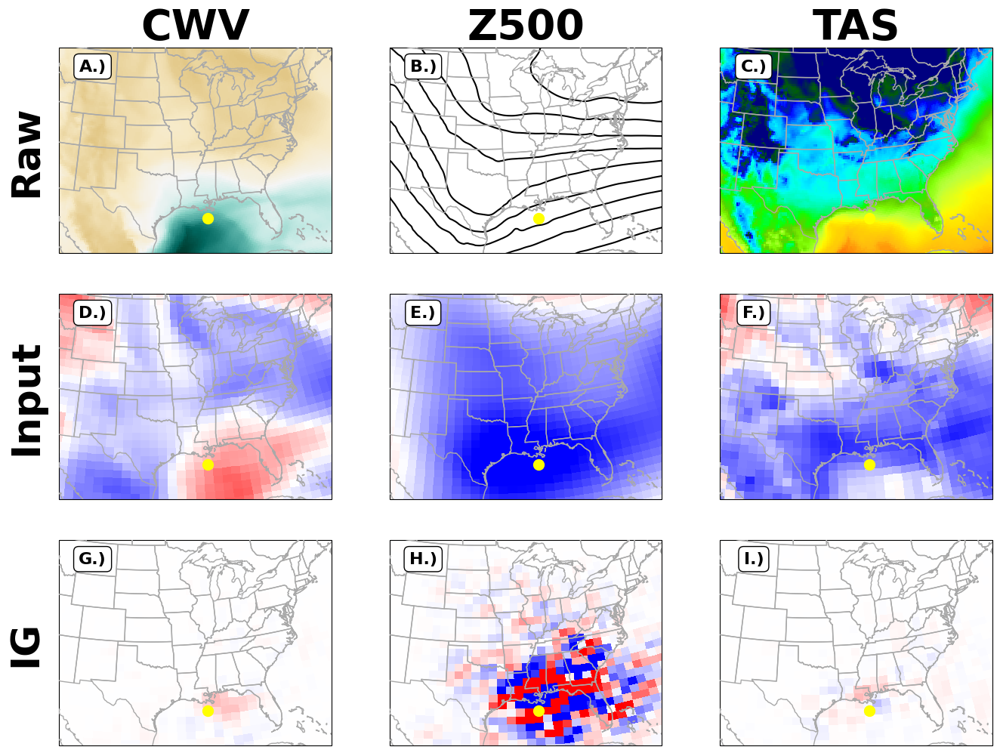

In [82]:
loc = 'se'
sample = 1117
iloc = np.where(locals()[f'df_{loc}_era5']['index'] == locals()[f'df_{loc}_era5']['index'].loc[sample])[0][0]
dt_val = locals()[f'df_{loc}_era5'].iloc[iloc]["Datetimes"]

fig = plt.figure(figsize=(16, 12))

for i in range (9):

    ax = plt.subplot(3, 3, i+1, projection=ccrs.LambertConformal(central_longitude=-98, central_latitude=35))

    if i <= 2:
        with h5netcdf.File(
            f"/sfs/weka/scratch/zkq5md/Data/ERA5/era5_{var_names[i]}_{dt_val[:4]}.nc", "r") as f:

            vals = f[names[i]][:]
            valid_times = f['valid_time'][:]
            datetimes = pd.to_datetime(valid_times, unit='s', origin='1970-01-01')
            lats_era = f['latitude'][:]
            lons_era = f['longitude'][:]
            doy_index = np.where(datetimes == pd.to_datetime(dt_val))[0][0]
            #vals = vals[doy_index-1]
            vals = vals[doy_index+1]

            if vals.shape != (721, 1440):
                ax.contour(lons_era, lats_era, vals[0],
                           transform=cartopy.crs.PlateCarree(),
                           colors='k', lw=100,
                           levels=np.arange(vals[0].min(), vals[0].max(), 600))
            else:
                c = ax.pcolormesh(lons_era, lats_era, vals,
                                  transform=cartopy.crs.PlateCarree(),
                                  cmap=cmaps_raw[i],
                                  vmax=[50, 0, 313, 0.011][i], vmin=[-20, 0, 263, 0][i])
            ax.set_title(f'{variables[i]}', fontsize=40, fontweight='bold')

    elif i >= 6:
        model_list = glob.glob(
                    f'{base_path}/Data/ERA5/models/trans_learn/pre/{loc}_max_precip_mse_model*')
        itgs = []

        for model_path in model_list:
            model = load_model(f"{model_path}", safe_mode=False)
    
            IntegratedGrad = get_integrated_gradients(np.expand_dims(x_test_era5[sample], 0)
                                                      , model).numpy()
            itgs.append(IntegratedGrad[0])


        vals = np.mean(np.array(itgs)[:, :, :, i%3], axis=0)
        c = ax.pcolormesh(lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
                          transform=cartopy.crs.PlateCarree(), cmap='bwr', vmin=-5, vmax=5)

    else:
        vals = x_test_era5[sample, :, :, i%3]
        c = ax.pcolormesh(
            lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
            transform=cartopy.crs.PlateCarree(),
            cmap='bwr', vmin=-2, vmax=2)
        
    ax = basic_map_details(ax, locals()[f'df_{loc}_era5'], iloc, [-110, -74, 23.5, 47.5])
    abc = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P']
    ax.annotate(f'{abc[i]}.)', (0, 0), textcoords="offset points",  color='k', fontsize=16, xytext=(-55, 90), ha='center',
                     bbox=dict(boxstyle='round', facecolor='w', alpha=1), fontweight='bold')

    if i%3 == 0:
                ax.text(
                    -0.05, 0.5, f'{info[int(i/3)]}',
                    transform=ax.transAxes,
                    fontsize=37, fontweight='bold',
                    va='center', ha='right', rotation=90
                )


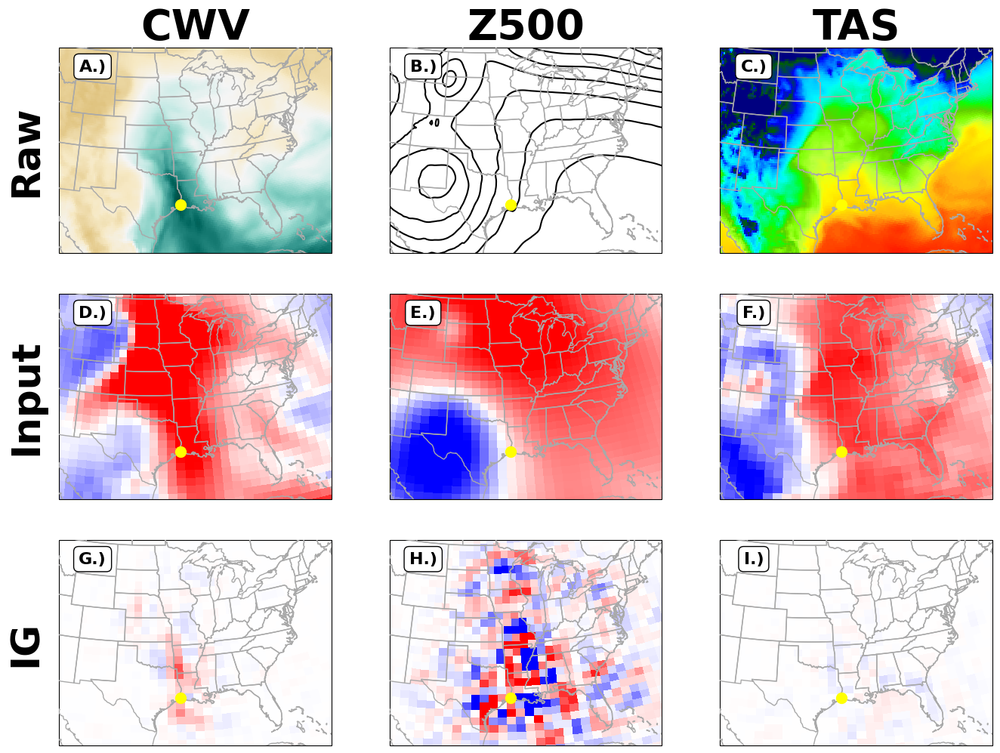

In [83]:
loc = 'se'
sample = 619
iloc = np.where(locals()[f'df_{loc}_era5']['index'] == locals()[f'df_{loc}_era5']['index'].loc[sample])[0][0]
dt_val = locals()[f'df_{loc}_era5'].iloc[iloc]["Datetimes"]

fig = plt.figure(figsize=(16, 12))

for i in range (9):

    ax = plt.subplot(3, 3, i+1, projection=ccrs.LambertConformal(central_longitude=-98, central_latitude=35))

    if i <= 2:
        with h5netcdf.File(
            f"/sfs/weka/scratch/zkq5md/Data/ERA5/era5_{var_names[i]}_{dt_val[:4]}.nc", "r") as f:

            vals = f[names[i]][:]
            valid_times = f['valid_time'][:]
            datetimes = pd.to_datetime(valid_times, unit='s', origin='1970-01-01')
            lats_era = f['latitude'][:]
            lons_era = f['longitude'][:]
            doy_index = np.where(datetimes == pd.to_datetime(dt_val))[0][0]
            #vals = vals[doy_index-1]
            vals = vals[doy_index+1]

            if vals.shape != (721, 1440):
                ax.contour(lons_era, lats_era, vals[0],
                           transform=cartopy.crs.PlateCarree(),
                           colors='k', lw=100,
                           levels=np.arange(vals[0].min(), vals[0].max(), 600))
            else:
                c = ax.pcolormesh(lons_era, lats_era, vals,
                                  transform=cartopy.crs.PlateCarree(),
                                  cmap=cmaps_raw[i],
                                  vmax=[50, 0, 313, 0.011][i], vmin=[-20, 0, 263, 0][i])
            ax.set_title(f'{variables[i]}', fontsize=40, fontweight='bold')

    elif i >= 6:
        model_list = glob.glob(
                    f'{base_path}/Data/ERA5/models/trans_learn/pre/{loc}_max_precip_mse_model*')
        itgs = []

        for model_path in model_list:
            model = load_model(f"{model_path}", safe_mode=False)
    
            IntegratedGrad = get_integrated_gradients(np.expand_dims(x_test_era5[sample], 0)
                                                      , model).numpy()
            itgs.append(IntegratedGrad[0])


        vals = np.mean(np.array(itgs)[:, :, :, i%3], axis=0)
        c = ax.pcolormesh(lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
                          transform=cartopy.crs.PlateCarree(), cmap='bwr', vmin=-5, vmax=5)

    else:
        vals = x_test_era5[sample, :, :, i%3]
        c = ax.pcolormesh(
            lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
            transform=cartopy.crs.PlateCarree(),
            cmap='bwr', vmin=-2, vmax=2)
        
    ax = basic_map_details(ax, locals()[f'df_{loc}_era5'], iloc, [-110, -74, 23.5, 47.5])
    abc = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P']
    ax.annotate(f'{abc[i]}.)', (0, 0), textcoords="offset points",  color='k', fontsize=16, xytext=(-55, 90), ha='center',
                     bbox=dict(boxstyle='round', facecolor='w', alpha=1), fontweight='bold')

    if i%3 == 0:
                ax.text(
                    -0.05, 0.5, f'{info[int(i/3)]}',
                    transform=ax.transAxes,
                    fontsize=37, fontweight='bold',
                    va='center', ha='right', rotation=90
                )


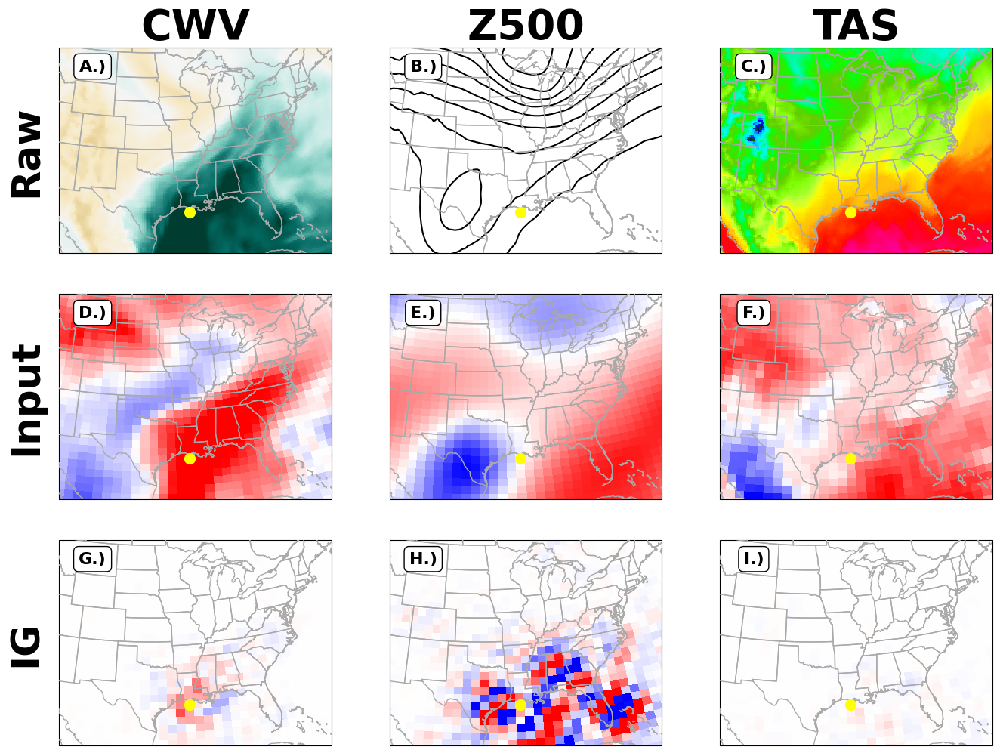

In [84]:
loc = 'se'
sample = 1921
iloc = np.where(locals()[f'df_{loc}_era5']['index'] == locals()[f'df_{loc}_era5']['index'].loc[sample])[0][0]
dt_val = locals()[f'df_{loc}_era5'].iloc[iloc]["Datetimes"]

fig = plt.figure(figsize=(16, 12))

for i in range (9):

    ax = plt.subplot(3, 3, i+1, projection=ccrs.LambertConformal(central_longitude=-98, central_latitude=35))

    if i <= 2:
        with h5netcdf.File(
            f"/sfs/weka/scratch/zkq5md/Data/ERA5/era5_{var_names[i]}_{dt_val[:4]}.nc", "r") as f:

            vals = f[names[i]][:]
            valid_times = f['valid_time'][:]
            datetimes = pd.to_datetime(valid_times, unit='s', origin='1970-01-01')
            lats_era = f['latitude'][:]
            lons_era = f['longitude'][:]
            doy_index = np.where(datetimes == pd.to_datetime(dt_val))[0][0]
            #vals = vals[doy_index-1]
            vals = vals[doy_index+1]

            if vals.shape != (721, 1440):
                ax.contour(lons_era, lats_era, vals[0],
                           transform=cartopy.crs.PlateCarree(),
                           colors='k', lw=100,
                           levels=np.arange(vals[0].min(), vals[0].max(), 600))
            else:
                c = ax.pcolormesh(lons_era, lats_era, vals,
                                  transform=cartopy.crs.PlateCarree(),
                                  cmap=cmaps_raw[i],
                                  vmax=[50, 0, 313, 0.011][i], vmin=[-20, 0, 263, 0][i])
            ax.set_title(f'{variables[i]}', fontsize=40, fontweight='bold')

    elif i >= 6:
        model_list = glob.glob(
                    f'{base_path}/Data/ERA5/models/trans_learn/pre/{loc}_max_precip_mse_model*')
        itgs = []

        for model_path in model_list:
            model = load_model(f"{model_path}", safe_mode=False)
    
            IntegratedGrad = get_integrated_gradients(np.expand_dims(x_test_era5[sample], 0)
                                                      , model).numpy()
            itgs.append(IntegratedGrad[0])


        vals = np.mean(np.array(itgs)[:, :, :, i%3], axis=0)
        c = ax.pcolormesh(lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
                          transform=cartopy.crs.PlateCarree(), cmap='bwr', vmin=-5, vmax=5)

    else:
        vals = x_test_era5[sample, :, :, i%3]
        c = ax.pcolormesh(
            lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
            transform=cartopy.crs.PlateCarree(),
            cmap='bwr', vmin=-2, vmax=2)
        
    ax = basic_map_details(ax, locals()[f'df_{loc}_era5'], iloc, [-110, -74, 23.5, 47.5])
    abc = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P']
    ax.annotate(f'{abc[i]}.)', (0, 0), textcoords="offset points",  color='k', fontsize=16, xytext=(-55, 90), ha='center',
                     bbox=dict(boxstyle='round', facecolor='w', alpha=1), fontweight='bold')

    if i%3 == 0:
                ax.text(
                    -0.05, 0.5, f'{info[int(i/3)]}',
                    transform=ax.transAxes,
                    fontsize=37, fontweight='bold',
                    va='center', ha='right', rotation=90
                )


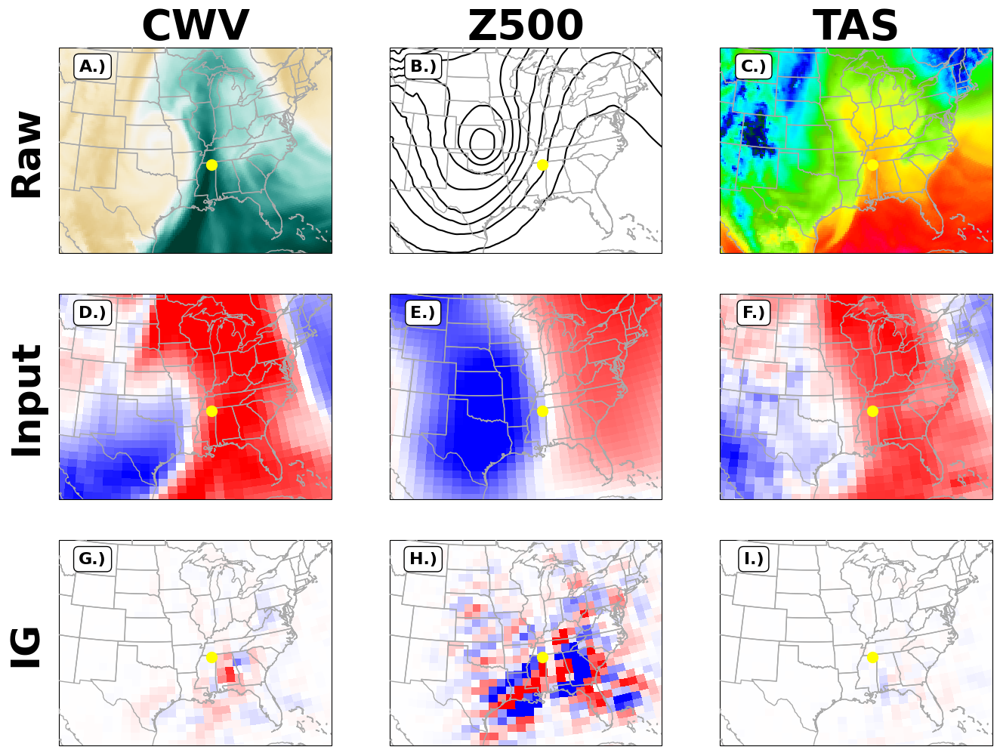

In [85]:
loc = 'se'
sample = 1938
iloc = np.where(locals()[f'df_{loc}_era5']['index'] == locals()[f'df_{loc}_era5']['index'].loc[sample])[0][0]
dt_val = locals()[f'df_{loc}_era5'].iloc[iloc]["Datetimes"]

fig = plt.figure(figsize=(16, 12))

for i in range (9):

    ax = plt.subplot(3, 3, i+1, projection=ccrs.LambertConformal(central_longitude=-98, central_latitude=35))

    if i <= 2:
        with h5netcdf.File(
            f"/sfs/weka/scratch/zkq5md/Data/ERA5/era5_{var_names[i]}_{dt_val[:4]}.nc", "r") as f:

            vals = f[names[i]][:]
            valid_times = f['valid_time'][:]
            datetimes = pd.to_datetime(valid_times, unit='s', origin='1970-01-01')
            lats_era = f['latitude'][:]
            lons_era = f['longitude'][:]
            doy_index = np.where(datetimes == pd.to_datetime(dt_val))[0][0]
            #vals = vals[doy_index-1]
            vals = vals[doy_index+1]

            if vals.shape != (721, 1440):
                ax.contour(lons_era, lats_era, vals[0],
                           transform=cartopy.crs.PlateCarree(),
                           colors='k', lw=100,
                           levels=np.arange(vals[0].min(), vals[0].max(), 600))
            else:
                c = ax.pcolormesh(lons_era, lats_era, vals,
                                  transform=cartopy.crs.PlateCarree(),
                                  cmap=cmaps_raw[i],
                                  vmax=[50, 0, 313, 0.011][i], vmin=[-20, 0, 263, 0][i])
            ax.set_title(f'{variables[i]}', fontsize=40, fontweight='bold')

    elif i >= 6:
        model_list = glob.glob(
                    f'{base_path}/Data/ERA5/models/trans_learn/pre/{loc}_max_precip_mse_model*')
        itgs = []

        for model_path in model_list:
            model = load_model(f"{model_path}", safe_mode=False)
    
            IntegratedGrad = get_integrated_gradients(np.expand_dims(x_test_era5[sample], 0)
                                                      , model).numpy()
            itgs.append(IntegratedGrad[0])


        vals = np.mean(np.array(itgs)[:, :, :, i%3], axis=0)
        c = ax.pcolormesh(lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
                          transform=cartopy.crs.PlateCarree(), cmap='bwr', vmin=-5, vmax=5)

    else:
        vals = x_test_era5[sample, :, :, i%3]
        c = ax.pcolormesh(
            lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
            transform=cartopy.crs.PlateCarree(),
            cmap='bwr', vmin=-2, vmax=2)
        
    ax = basic_map_details(ax, locals()[f'df_{loc}_era5'], iloc, [-110, -74, 23.5, 47.5])
    abc = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P']
    ax.annotate(f'{abc[i]}.)', (0, 0), textcoords="offset points",  color='k', fontsize=16, xytext=(-55, 90), ha='center',
                     bbox=dict(boxstyle='round', facecolor='w', alpha=1), fontweight='bold')

    if i%3 == 0:
                ax.text(
                    -0.05, 0.5, f'{info[int(i/3)]}',
                    transform=ax.transAxes,
                    fontsize=37, fontweight='bold',
                    va='center', ha='right', rotation=90
                )


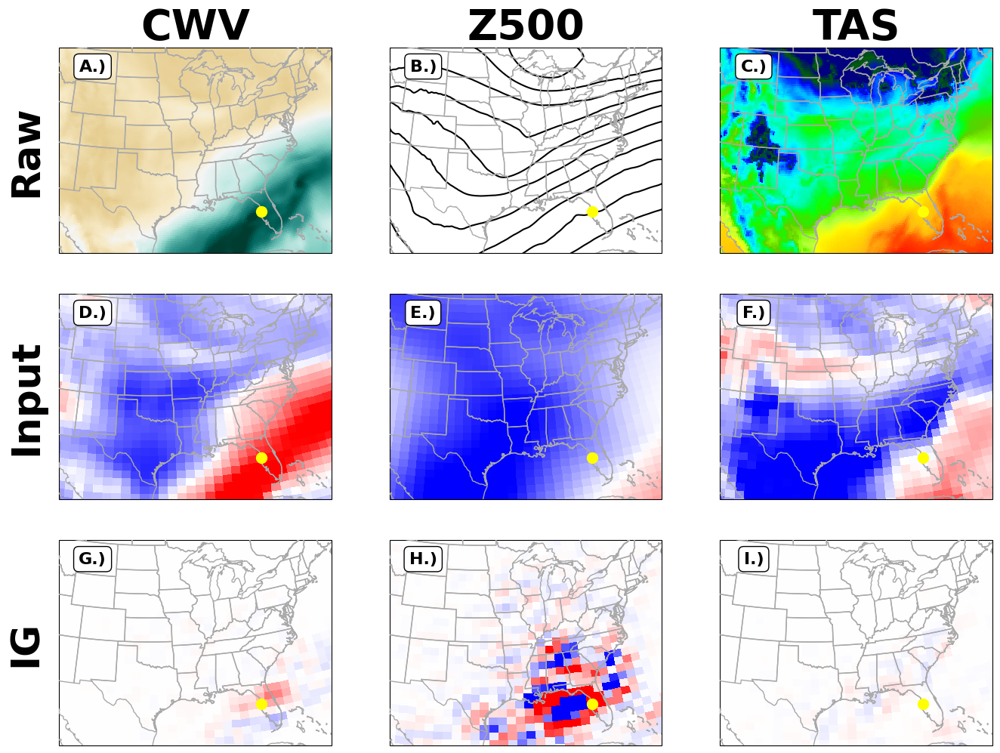

In [86]:
loc = 'se'
sample = 394
iloc = np.where(locals()[f'df_{loc}_era5']['index'] == locals()[f'df_{loc}_era5']['index'].loc[sample])[0][0]
dt_val = locals()[f'df_{loc}_era5'].iloc[iloc]["Datetimes"]

fig = plt.figure(figsize=(16, 12))

for i in range (9):

    ax = plt.subplot(3, 3, i+1, projection=ccrs.LambertConformal(central_longitude=-98, central_latitude=35))

    if i <= 2:
        with h5netcdf.File(
            f"/sfs/weka/scratch/zkq5md/Data/ERA5/era5_{var_names[i]}_{dt_val[:4]}.nc", "r") as f:

            vals = f[names[i]][:]
            valid_times = f['valid_time'][:]
            datetimes = pd.to_datetime(valid_times, unit='s', origin='1970-01-01')
            lats_era = f['latitude'][:]
            lons_era = f['longitude'][:]
            doy_index = np.where(datetimes == pd.to_datetime(dt_val))[0][0]
            #vals = vals[doy_index-1]
            vals = vals[doy_index+1]

            if vals.shape != (721, 1440):
                ax.contour(lons_era, lats_era, vals[0],
                           transform=cartopy.crs.PlateCarree(),
                           colors='k', lw=100,
                           levels=np.arange(vals[0].min(), vals[0].max(), 600))
            else:
                c = ax.pcolormesh(lons_era, lats_era, vals,
                                  transform=cartopy.crs.PlateCarree(),
                                  cmap=cmaps_raw[i],
                                  vmax=[50, 0, 313, 0.011][i], vmin=[-20, 0, 263, 0][i])
            ax.set_title(f'{variables[i]}', fontsize=40, fontweight='bold')

    elif i >= 6:
        model_list = glob.glob(
                    f'{base_path}/Data/ERA5/models/trans_learn/pre/{loc}_max_precip_mse_model*')
        itgs = []

        for model_path in model_list:
            model = load_model(f"{model_path}", safe_mode=False)
    
            IntegratedGrad = get_integrated_gradients(np.expand_dims(x_test_era5[sample], 0)
                                                      , model).numpy()
            itgs.append(IntegratedGrad[0])


        vals = np.mean(np.array(itgs)[:, :, :, i%3], axis=0)
        c = ax.pcolormesh(lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
                          transform=cartopy.crs.PlateCarree(), cmap='bwr', vmin=-5, vmax=5)

    else:
        vals = x_test_era5[sample, :, :, i%3]
        c = ax.pcolormesh(
            lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
            transform=cartopy.crs.PlateCarree(),
            cmap='bwr', vmin=-2, vmax=2)
        
    ax = basic_map_details(ax, locals()[f'df_{loc}_era5'], iloc, [-110, -74, 23.5, 47.5])
    abc = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P']
    ax.annotate(f'{abc[i]}.)', (0, 0), textcoords="offset points",  color='k', fontsize=16, xytext=(-55, 90), ha='center',
                     bbox=dict(boxstyle='round', facecolor='w', alpha=1), fontweight='bold')

    if i%3 == 0:
                ax.text(
                    -0.05, 0.5, f'{info[int(i/3)]}',
                    transform=ax.transAxes,
                    fontsize=37, fontweight='bold',
                    va='center', ha='right', rotation=90
                )


In [87]:
## California

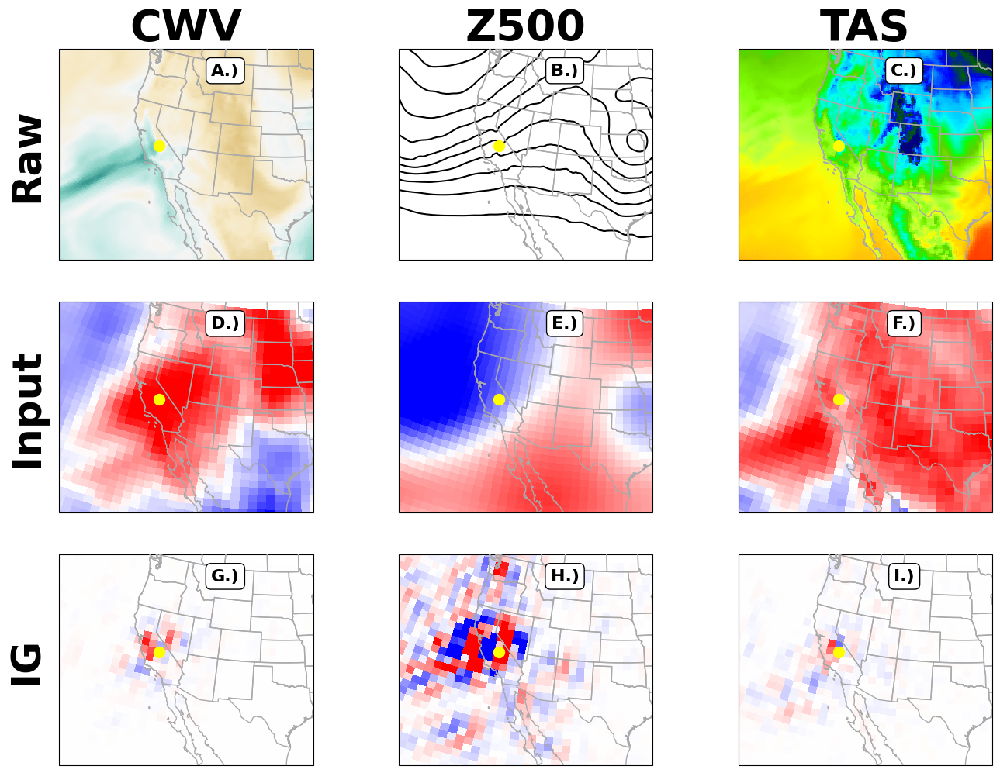

In [88]:
loc = 'ca'
sample = 471
iloc = np.where(locals()[f'df_{loc}_era5']['index'] == locals()[f'df_{loc}_era5']['index'].loc[sample])[0][0]
dt_val = locals()[f'df_{loc}_era5'].iloc[iloc]["Datetimes"]

fig = plt.figure(figsize=(16, 12))

for i in range (9):

    ax = plt.subplot(3, 3, i+1, projection=ccrs.LambertConformal(central_longitude=-98, central_latitude=35))

    if i <= 2:
        with h5netcdf.File(
            f"/sfs/weka/scratch/zkq5md/Data/ERA5/era5_{var_names[i]}_{dt_val[:4]}.nc", "r") as f:

            vals = f[names[i]][:]
            valid_times = f['valid_time'][:]
            datetimes = pd.to_datetime(valid_times, unit='s', origin='1970-01-01')
            lats_era = f['latitude'][:]
            lons_era = f['longitude'][:]
            doy_index = np.where(datetimes == pd.to_datetime(dt_val))[0][0]
            #vals = vals[doy_index-1]
            vals = vals[doy_index+1]

            if vals.shape != (721, 1440):
                ax.contour(lons_era, lats_era, vals[0],
                           transform=cartopy.crs.PlateCarree(),
                           colors='k', lw=100,
                           levels=np.arange(vals[0].min(), vals[0].max(), 600))
            else:
                c = ax.pcolormesh(lons_era, lats_era, vals,
                                  transform=cartopy.crs.PlateCarree(),
                                  cmap=cmaps_raw[i],
                                  vmax=[50, 0, 313, 0.011][i], vmin=[-20, 0, 263, 0][i])
            ax.set_title(f'{variables[i]}', fontsize=40, fontweight='bold')

    elif i >= 6:
        model_list = glob.glob(
                    f'{base_path}/Data/ERA5/models/trans_learn/pre/{loc}_max_precip_mse_model*')
        itgs = []

        for model_path in model_list:
            model = load_model(f"{model_path}", safe_mode=False)
    
            IntegratedGrad = get_integrated_gradients(np.expand_dims(x_test_era5[sample], 0)
                                                      , model).numpy()
            itgs.append(IntegratedGrad[0])


        vals = np.mean(np.array(itgs)[:, :, :, i%3], axis=0)
        c = ax.pcolormesh(lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
                          transform=cartopy.crs.PlateCarree(), cmap='bwr', vmin=-5, vmax=5)

    else:
        vals = x_test_era5[sample, :, :, i%3]
        c = ax.pcolormesh(
            lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
            transform=cartopy.crs.PlateCarree(),
            cmap='bwr', vmin=-2, vmax=2)
        
    ax = basic_map_details(ax, locals()[f'df_{loc}_era5'], iloc, [-130, -94, 23.5, 47.5])
    abc = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P']
    ax.annotate(f'{abc[i]}.)', (0, 0), textcoords="offset points",  color='k', fontsize=16, xytext=(-55, 90), ha='center',
                     bbox=dict(boxstyle='round', facecolor='w', alpha=1), fontweight='bold')

    if i%3 == 0:
                ax.text(
                    -0.05, 0.5, f'{info[int(i/3)]}',
                    transform=ax.transAxes,
                    fontsize=37, fontweight='bold',
                    va='center', ha='right', rotation=90
                )


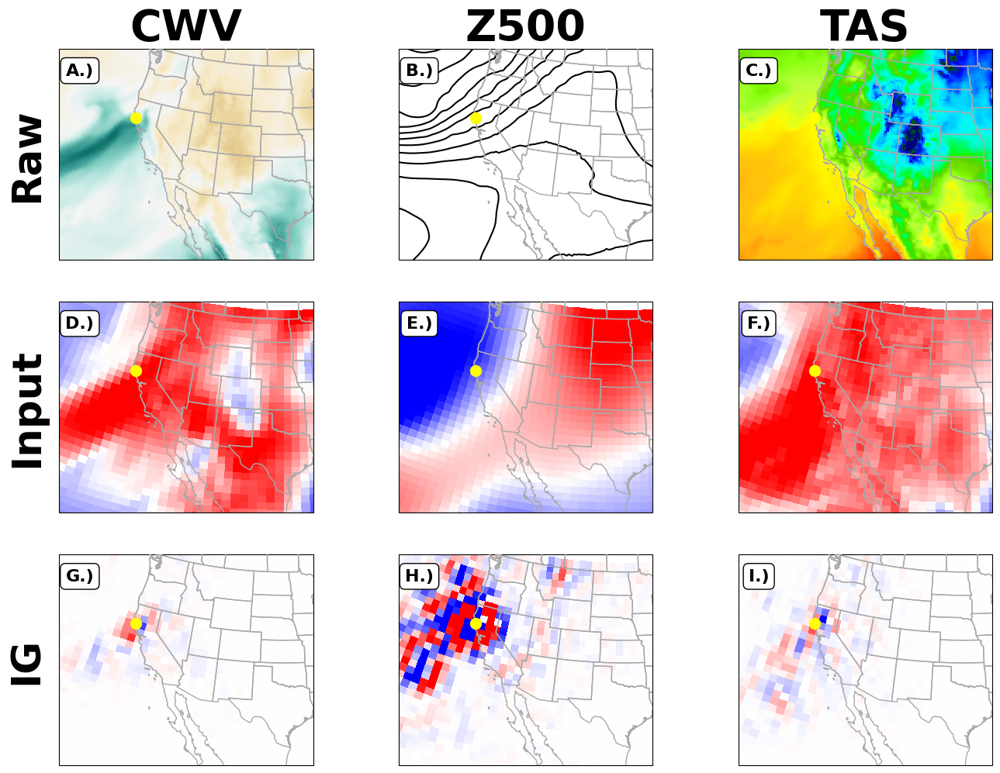

In [11]:
loc = 'ca'
sample = 1810
iloc = np.where(locals()[f'df_{loc}_era5']['index'] == locals()[f'df_{loc}_era5']['index'].loc[sample])[0][0]
dt_val = locals()[f'df_{loc}_era5'].iloc[iloc]["Datetimes"]

fig = plt.figure(figsize=(16, 12))

for i in range (9):

    ax = plt.subplot(3, 3, i+1, projection=ccrs.LambertConformal(central_longitude=-98, central_latitude=35))

    if i <= 2:
        with h5netcdf.File(
            f"/sfs/weka/scratch/zkq5md/Data/ERA5/era5_{var_names[i]}_{dt_val[:4]}.nc", "r") as f:

            vals = f[names[i]][:]
            valid_times = f['valid_time'][:]
            datetimes = pd.to_datetime(valid_times, unit='s', origin='1970-01-01')
            lats_era = f['latitude'][:]
            lons_era = f['longitude'][:]
            doy_index = np.where(datetimes == pd.to_datetime(dt_val))[0][0]
            #vals = vals[doy_index-1]
            vals = vals[doy_index+1]

            if vals.shape != (721, 1440):
                ax.contour(lons_era, lats_era, vals[0],
                           transform=cartopy.crs.PlateCarree(),
                           colors='k', lw=100,
                           levels=np.arange(vals[0].min(), vals[0].max(), 600))
            else:
                c = ax.pcolormesh(lons_era, lats_era, vals,
                                  transform=cartopy.crs.PlateCarree(),
                                  cmap=cmaps_raw[i],
                                  vmax=[50, 0, 313, 0.011][i], vmin=[-20, 0, 263, 0][i])
            ax.set_title(f'{variables[i]}', fontsize=40, fontweight='bold')

    elif i >= 6:
        model_list = glob.glob(
                    f'{base_path}/Data/ERA5/models/trans_learn/pre/{loc}_max_precip_mse_model*')
        itgs = []

        for model_path in model_list:
            model = load_model(f"{model_path}", safe_mode=False)
    
            IntegratedGrad = get_integrated_gradients(np.expand_dims(x_test_era5[sample], 0)
                                                      , model).numpy()
            itgs.append(IntegratedGrad[0])


        vals = np.mean(np.array(itgs)[:, :, :, i%3], axis=0)
        c = ax.pcolormesh(lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
                          transform=cartopy.crs.PlateCarree(), cmap='bwr', vmin=-5, vmax=5)

    else:
        vals = x_test_era5[sample, :, :, i%3]
        c = ax.pcolormesh(
            lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
            transform=cartopy.crs.PlateCarree(),
            cmap='bwr', vmin=-2, vmax=2)
        
    ax = basic_map_details(ax, locals()[f'df_{loc}_era5'], iloc, [-130, -94, 23.5, 47.5])
    abc = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P']
    ax.annotate(f'{abc[i]}.)', (0, 0), textcoords="offset points",  color='k', fontsize=16, xytext=(-190, 90), ha='center',
                     bbox=dict(boxstyle='round', facecolor='w', alpha=1), fontweight='bold')

    if i%3 == 0:
                ax.text(
                    -0.05, 0.5, f'{info[int(i/3)]}',
                    transform=ax.transAxes,
                    fontsize=37, fontweight='bold',
                    va='center', ha='right', rotation=90
                )
        
plt.savefig(f'xai_{loc}_{sample}.png', format='png', dpi=500, bbox_inches='tight')

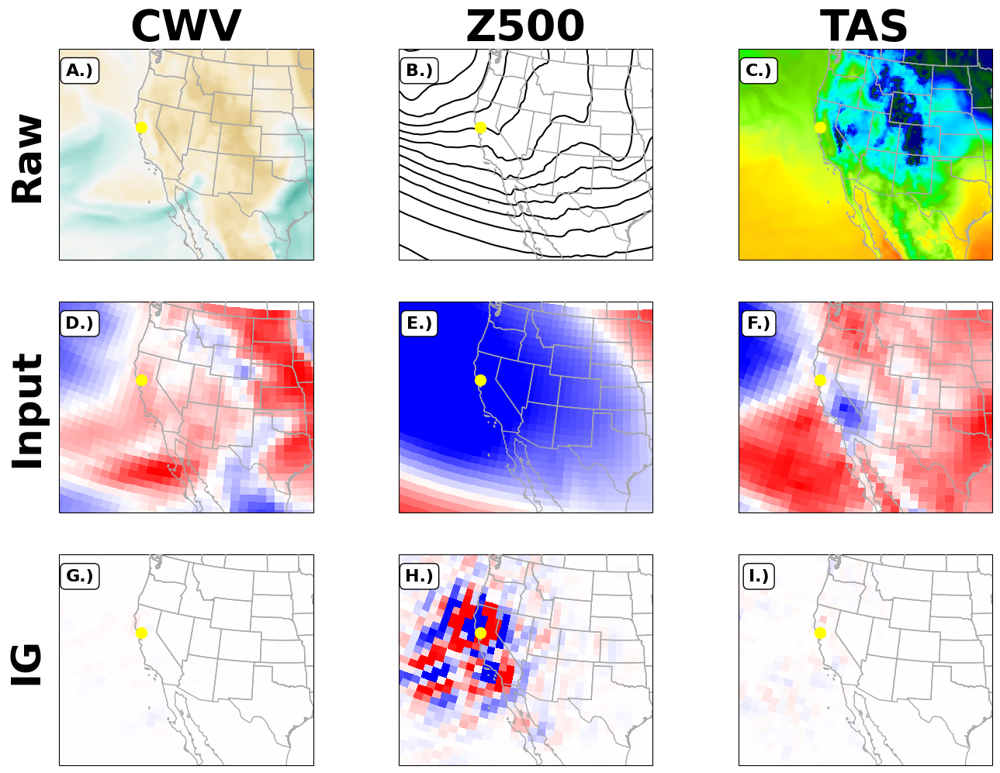

In [10]:
loc = 'ca'
sample = 1094
iloc = np.where(locals()[f'df_{loc}_era5']['index'] == locals()[f'df_{loc}_era5']['index'].loc[sample])[0][0]
dt_val = locals()[f'df_{loc}_era5'].iloc[iloc]["Datetimes"]

fig = plt.figure(figsize=(16, 12))

for i in range (9):

    ax = plt.subplot(3, 3, i+1, projection=ccrs.LambertConformal(central_longitude=-98, central_latitude=35))

    if i <= 2:
        with h5netcdf.File(
            f"/sfs/weka/scratch/zkq5md/Data/ERA5/era5_{var_names[i]}_{dt_val[:4]}.nc", "r") as f:

            vals = f[names[i]][:]
            valid_times = f['valid_time'][:]
            datetimes = pd.to_datetime(valid_times, unit='s', origin='1970-01-01')
            lats_era = f['latitude'][:]
            lons_era = f['longitude'][:]
            doy_index = np.where(datetimes == pd.to_datetime(dt_val))[0][0]
            #vals = vals[doy_index-1]
            vals = vals[doy_index+1]

            if vals.shape != (721, 1440):
                ax.contour(lons_era, lats_era, vals[0],
                           transform=cartopy.crs.PlateCarree(),
                           colors='k', lw=100,
                           levels=np.arange(vals[0].min(), vals[0].max(), 600))
            else:
                c = ax.pcolormesh(lons_era, lats_era, vals,
                                  transform=cartopy.crs.PlateCarree(),
                                  cmap=cmaps_raw[i],
                                  vmax=[50, 0, 313, 0.011][i], vmin=[-20, 0, 263, 0][i])
            ax.set_title(f'{variables[i]}', fontsize=40, fontweight='bold')

    elif i >= 6:
        model_list = glob.glob(
                    f'{base_path}/Data/ERA5/models/trans_learn/pre/{loc}_max_precip_mse_model*')
        itgs = []

        for model_path in model_list:
            model = load_model(f"{model_path}", safe_mode=False)
    
            IntegratedGrad = get_integrated_gradients(np.expand_dims(x_test_era5[sample], 0)
                                                      , model).numpy()
            itgs.append(IntegratedGrad[0])


        vals = np.mean(np.array(itgs)[:, :, :, i%3], axis=0)
        c = ax.pcolormesh(lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
                          transform=cartopy.crs.PlateCarree(), cmap='bwr', vmin=-5, vmax=5)

    else:
        vals = x_test_era5[sample, :, :, i%3]
        c = ax.pcolormesh(
            lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
            transform=cartopy.crs.PlateCarree(),
            cmap='bwr', vmin=-2, vmax=2)
        
    ax = basic_map_details(ax, locals()[f'df_{loc}_era5'], iloc, [-130, -94, 23.5, 47.5])
    abc = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P']
    ax.annotate(f'{abc[i]}.)', (0, 0), textcoords="offset points",  color='k', fontsize=16, xytext=(-190, 90), ha='center',
                     bbox=dict(boxstyle='round', facecolor='w', alpha=1), fontweight='bold')

    if i%3 == 0:
                ax.text(
                    -0.05, 0.5, f'{info[int(i/3)]}',
                    transform=ax.transAxes,
                    fontsize=37, fontweight='bold',
                    va='center', ha='right', rotation=90
                )

plt.savefig(f'xai_{loc}_{sample}.png', format='png', dpi=500, bbox_inches='tight')

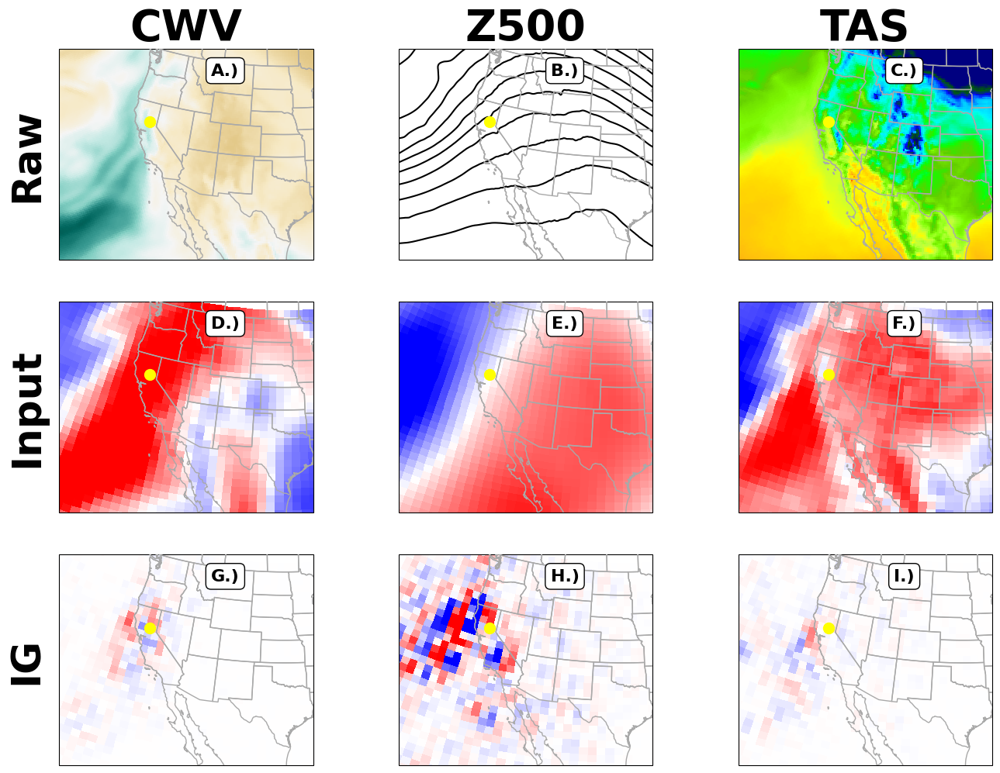

In [91]:
loc = 'ca'
sample = 527
iloc = np.where(locals()[f'df_{loc}_era5']['index'] == locals()[f'df_{loc}_era5']['index'].loc[sample])[0][0]
dt_val = locals()[f'df_{loc}_era5'].iloc[iloc]["Datetimes"]

fig = plt.figure(figsize=(16, 12))

for i in range (9):

    ax = plt.subplot(3, 3, i+1, projection=ccrs.LambertConformal(central_longitude=-98, central_latitude=35))

    if i <= 2:
        with h5netcdf.File(
            f"/sfs/weka/scratch/zkq5md/Data/ERA5/era5_{var_names[i]}_{dt_val[:4]}.nc", "r") as f:

            vals = f[names[i]][:]
            valid_times = f['valid_time'][:]
            datetimes = pd.to_datetime(valid_times, unit='s', origin='1970-01-01')
            lats_era = f['latitude'][:]
            lons_era = f['longitude'][:]
            doy_index = np.where(datetimes == pd.to_datetime(dt_val))[0][0]
            #vals = vals[doy_index-1]
            vals = vals[doy_index+1]

            if vals.shape != (721, 1440):
                ax.contour(lons_era, lats_era, vals[0],
                           transform=cartopy.crs.PlateCarree(),
                           colors='k', lw=100,
                           levels=np.arange(vals[0].min(), vals[0].max(), 600))
            else:
                c = ax.pcolormesh(lons_era, lats_era, vals,
                                  transform=cartopy.crs.PlateCarree(),
                                  cmap=cmaps_raw[i],
                                  vmax=[50, 0, 313, 0.011][i], vmin=[-20, 0, 263, 0][i])
            ax.set_title(f'{variables[i]}', fontsize=40, fontweight='bold')

    elif i >= 6:
        model_list = glob.glob(
                    f'{base_path}/Data/ERA5/models/trans_learn/pre/{loc}_max_precip_mse_model*')
        itgs = []

        for model_path in model_list:
            model = load_model(f"{model_path}", safe_mode=False)
    
            IntegratedGrad = get_integrated_gradients(np.expand_dims(x_test_era5[sample], 0)
                                                      , model).numpy()
            itgs.append(IntegratedGrad[0])


        vals = np.mean(np.array(itgs)[:, :, :, i%3], axis=0)
        c = ax.pcolormesh(lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
                          transform=cartopy.crs.PlateCarree(), cmap='bwr', vmin=-5, vmax=5)

    else:
        vals = x_test_era5[sample, :, :, i%3]
        c = ax.pcolormesh(
            lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
            transform=cartopy.crs.PlateCarree(),
            cmap='bwr', vmin=-2, vmax=2)
        
    ax = basic_map_details(ax, locals()[f'df_{loc}_era5'], iloc, [-130, -94, 23.5, 47.5])
    abc = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P']
    ax.annotate(f'{abc[i]}.)', (0, 0), textcoords="offset points",  color='k', fontsize=16, xytext=(-55, 90), ha='center',
                     bbox=dict(boxstyle='round', facecolor='w', alpha=1), fontweight='bold')

    if i%3 == 0:
                ax.text(
                    -0.05, 0.5, f'{info[int(i/3)]}',
                    transform=ax.transAxes,
                    fontsize=37, fontweight='bold',
                    va='center', ha='right', rotation=90
                )


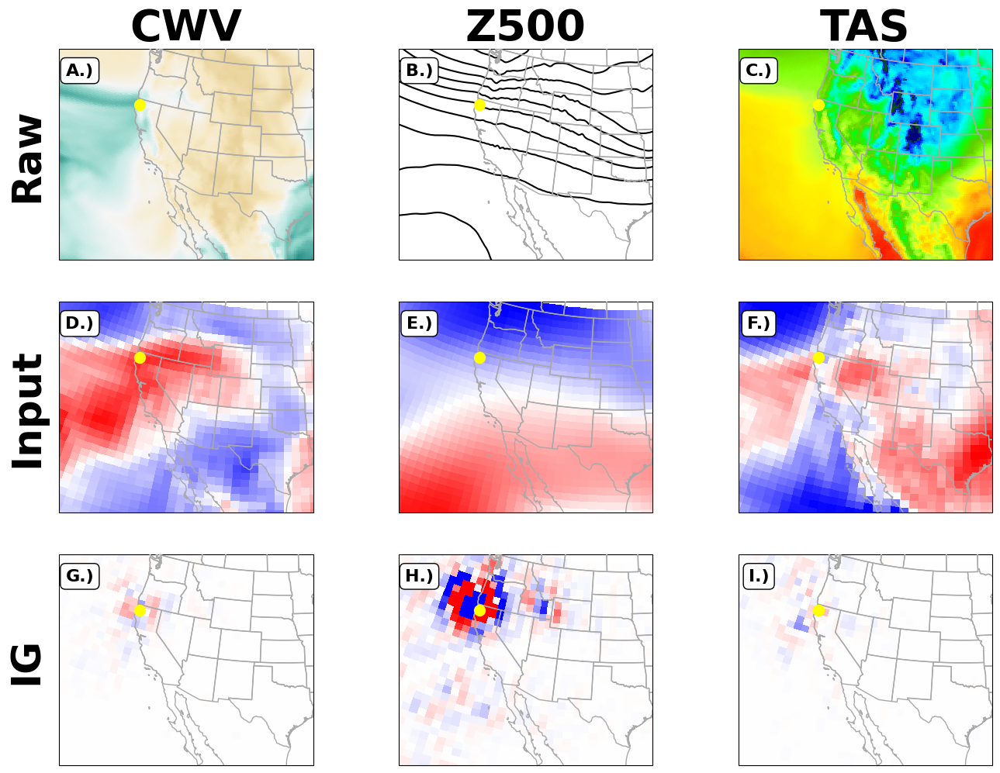

In [105]:
loc = 'ca'
sample = 414
iloc = np.where(locals()[f'df_{loc}_era5']['index'] == locals()[f'df_{loc}_era5']['index'].loc[sample])[0][0]
dt_val = locals()[f'df_{loc}_era5'].iloc[iloc]["Datetimes"]

fig = plt.figure(figsize=(16, 12))

for i in range (9):

    ax = plt.subplot(3, 3, i+1, projection=ccrs.LambertConformal(central_longitude=-98, central_latitude=35))

    if i <= 2:
        with h5netcdf.File(
            f"/sfs/weka/scratch/zkq5md/Data/ERA5/era5_{var_names[i]}_{dt_val[:4]}.nc", "r") as f:

            vals = f[names[i]][:]
            valid_times = f['valid_time'][:]
            datetimes = pd.to_datetime(valid_times, unit='s', origin='1970-01-01')
            lats_era = f['latitude'][:]
            lons_era = f['longitude'][:]
            doy_index = np.where(datetimes == pd.to_datetime(dt_val))[0][0]
            #vals = vals[doy_index-1]
            vals = vals[doy_index+1]

            if vals.shape != (721, 1440):
                ax.contour(lons_era, lats_era, vals[0],
                           transform=cartopy.crs.PlateCarree(),
                           colors='k', lw=100,
                           levels=np.arange(vals[0].min(), vals[0].max(), 600))
            else:
                c = ax.pcolormesh(lons_era, lats_era, vals,
                                  transform=cartopy.crs.PlateCarree(),
                                  cmap=cmaps_raw[i],
                                  vmax=[50, 0, 313, 0.011][i], vmin=[-20, 0, 263, 0][i])

            ax.set_title(f'{variables[i]}', fontsize=40, fontweight='bold')

    elif i >= 6:
        model_list = glob.glob(
                    f'{base_path}/Data/ERA5/models/trans_learn/pre/{loc}_max_precip_mse_model*')
        itgs = []

        for model_path in model_list:
            model = load_model(f"{model_path}", safe_mode=False)
    
            IntegratedGrad = get_integrated_gradients(np.expand_dims(x_test_era5[sample], 0)
                                                      , model).numpy()
            itgs.append(IntegratedGrad[0])


        vals = np.mean(np.array(itgs)[:, :, :, i%3], axis=0)
        c = ax.pcolormesh(lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
                          transform=cartopy.crs.PlateCarree(), cmap='bwr', vmin=-5, vmax=5)

    else:
        vals = x_test_era5[sample, :, :, i%3]
        c = ax.pcolormesh(
            lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
            transform=cartopy.crs.PlateCarree(),
            cmap='bwr', vmin=-2, vmax=2)
        
        
        
    ax = basic_map_details(ax, locals()[f'df_{loc}_era5'], iloc, [-130, -94, 23.5, 47.5])
    abc = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P']
    ax.annotate(f'{abc[i]}.)', (0, 0), textcoords="offset points",  color='k', fontsize=16, xytext=(-190, 90), ha='center',
                     bbox=dict(boxstyle='round', facecolor='w', alpha=1), fontweight='bold')

    if i%3 == 0:
                ax.text(
                    -0.05, 0.5, f'{info[int(i/3)]}',
                    transform=ax.transAxes,
                    fontsize=37, fontweight='bold',
                    va='center', ha='right', rotation=90
                )
        
plt.savefig(f'xai_{loc}_{sample}.png', format='png', dpi=500, bbox_inches='tight')

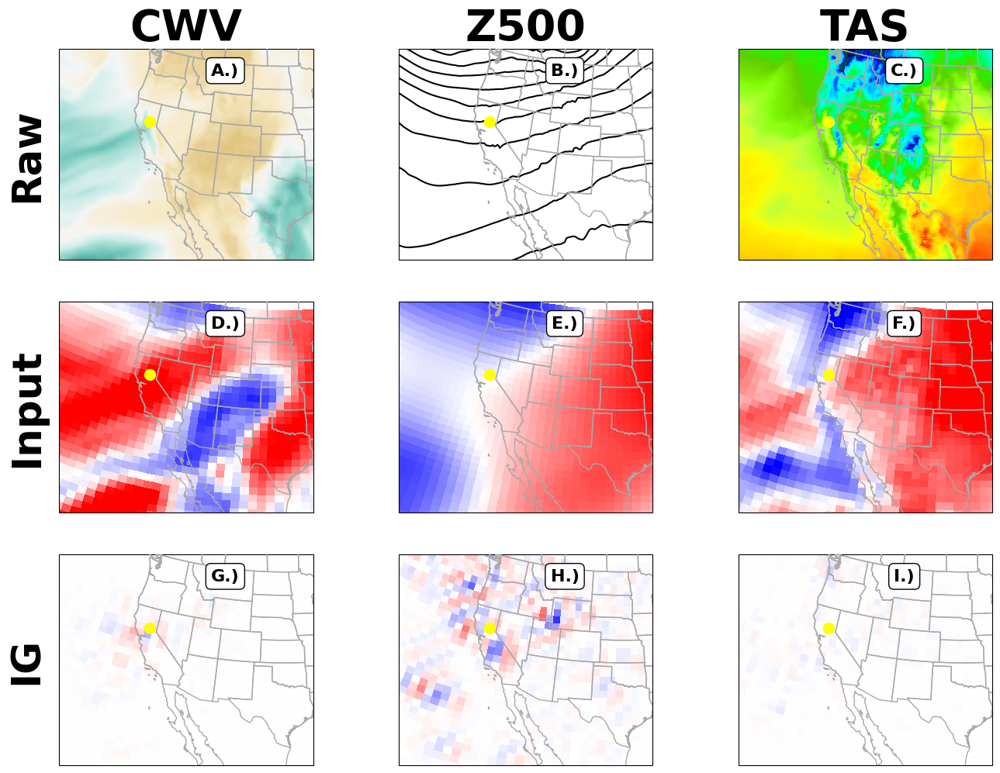

In [93]:
loc = 'ca'
sample = 1450
iloc = np.where(locals()[f'df_{loc}_era5']['index'] == locals()[f'df_{loc}_era5']['index'].loc[sample])[0][0]
dt_val = locals()[f'df_{loc}_era5'].iloc[iloc]["Datetimes"]

fig = plt.figure(figsize=(16, 12))

for i in range (9):

    ax = plt.subplot(3, 3, i+1, projection=ccrs.LambertConformal(central_longitude=-98, central_latitude=35))

    if i <= 2:
        with h5netcdf.File(
            f"/sfs/weka/scratch/zkq5md/Data/ERA5/era5_{var_names[i]}_{dt_val[:4]}.nc", "r") as f:

            vals = f[names[i]][:]
            valid_times = f['valid_time'][:]
            datetimes = pd.to_datetime(valid_times, unit='s', origin='1970-01-01')
            lats_era = f['latitude'][:]
            lons_era = f['longitude'][:]
            doy_index = np.where(datetimes == pd.to_datetime(dt_val))[0][0]
            #vals = vals[doy_index-1]
            vals = vals[doy_index+1]

            if vals.shape != (721, 1440):
                ax.contour(lons_era, lats_era, vals[0],
                           transform=cartopy.crs.PlateCarree(),
                           colors='k', lw=100,
                           levels=np.arange(vals[0].min(), vals[0].max(), 600))
            else:
                c = ax.pcolormesh(lons_era, lats_era, vals,
                                  transform=cartopy.crs.PlateCarree(),
                                  cmap=cmaps_raw[i],
                                  vmax=[50, 0, 313, 0.011][i], vmin=[-20, 0, 263, 0][i])
            ax.set_title(f'{variables[i]}', fontsize=40, fontweight='bold')

    elif i >= 6:
        model_list = glob.glob(
                    f'{base_path}/Data/ERA5/models/trans_learn/pre/{loc}_max_precip_mse_model*')
        itgs = []

        for model_path in model_list:
            model = load_model(f"{model_path}", safe_mode=False)
    
            IntegratedGrad = get_integrated_gradients(np.expand_dims(x_test_era5[sample], 0)
                                                      , model).numpy()
            itgs.append(IntegratedGrad[0])


        vals = np.mean(np.array(itgs)[:, :, :, i%3], axis=0)
        c = ax.pcolormesh(lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
                          transform=cartopy.crs.PlateCarree(), cmap='bwr', vmin=-5, vmax=5)

    else:
        vals = x_test_era5[sample, :, :, i%3]
        c = ax.pcolormesh(
            lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
            transform=cartopy.crs.PlateCarree(),
            cmap='bwr', vmin=-2, vmax=2)
        
    ax = basic_map_details(ax, locals()[f'df_{loc}_era5'], iloc, [-130, -94, 23.5, 47.5])
    abc = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P']
    ax.annotate(f'{abc[i]}.)', (0, 0), textcoords="offset points",  color='k', fontsize=16, xytext=(-55, 90), ha='center',
                     bbox=dict(boxstyle='round', facecolor='w', alpha=1), fontweight='bold')

    if i%3 == 0:
                ax.text(
                    -0.05, 0.5, f'{info[int(i/3)]}',
                    transform=ax.transAxes,
                    fontsize=37, fontweight='bold',
                    va='center', ha='right', rotation=90
                )


In [94]:
## Great Plains

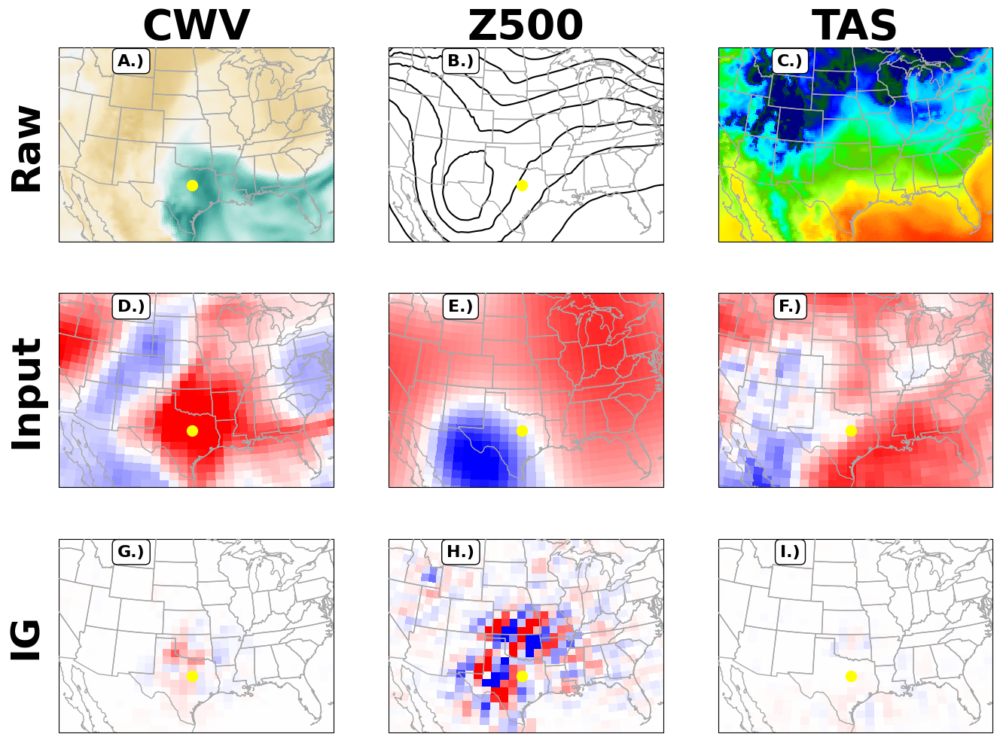

In [97]:
loc = 'gp'
sample = 1401
iloc = np.where(locals()[f'df_{loc}_era5']['index'] == locals()[f'df_{loc}_era5']['index'].loc[sample])[0][0]
dt_val = locals()[f'df_{loc}_era5'].iloc[iloc]["Datetimes"]

fig = plt.figure(figsize=(16, 12))

for i in range (9):

    ax = plt.subplot(3, 3, i+1, projection=ccrs.LambertConformal(central_longitude=-98, central_latitude=35))

    if i <= 2:
        with h5netcdf.File(
            f"/sfs/weka/scratch/zkq5md/Data/ERA5/era5_{var_names[i]}_{dt_val[:4]}.nc", "r") as f:

            vals = f[names[i]][:]
            valid_times = f['valid_time'][:]
            datetimes = pd.to_datetime(valid_times, unit='s', origin='1970-01-01')
            lats_era = f['latitude'][:]
            lons_era = f['longitude'][:]
            doy_index = np.where(datetimes == pd.to_datetime(dt_val))[0][0]
            #vals = vals[doy_index-1]
            vals = vals[doy_index+1]

            if vals.shape != (721, 1440):
                ax.contour(lons_era, lats_era, vals[0],
                           transform=cartopy.crs.PlateCarree(),
                           colors='k', lw=100,
                           levels=np.arange(vals[0].min(), vals[0].max(), 600))
            else:
                c = ax.pcolormesh(lons_era, lats_era, vals,
                                  transform=cartopy.crs.PlateCarree(),
                                  cmap=cmaps_raw[i],
                                  vmax=[50, 0, 313, 0.011][i], vmin=[-20, 0, 263, 0][i])
            ax.set_title(f'{variables[i]}', fontsize=40, fontweight='bold')

    elif i >= 6:
        model_list = glob.glob(
                    f'{base_path}/Data/ERA5/models/trans_learn/pre/{loc}_max_precip_mse_model*')
        itgs = []

        for model_path in model_list:
            model = load_model(f"{model_path}", safe_mode=False)
    
            IntegratedGrad = get_integrated_gradients(np.expand_dims(x_test_era5[sample], 0)
                                                      , model).numpy()
            itgs.append(IntegratedGrad[0])


        vals = np.mean(np.array(itgs)[:, :, :, i%3], axis=0)
        c = ax.pcolormesh(lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
                          transform=cartopy.crs.PlateCarree(), cmap='bwr', vmin=-5, vmax=5)

    else:
        vals = x_test_era5[sample, :, :, i%3]
        c = ax.pcolormesh(
            lon[lon_bnd1:lon_bnd2], lat[lat_bnd1:lat_bnd2], vals,
            transform=cartopy.crs.PlateCarree(),
            cmap='bwr', vmin=-2, vmax=2)
        
    ax = basic_map_details(ax, locals()[f'df_{loc}_era5'], iloc, [-115, -79, 23.5, 47.5])
    abc = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P']
    ax.annotate(f'{abc[i]}.)', (0, 0), textcoords="offset points",  color='k', fontsize=16, xytext=(-55, 90), ha='center',
                     bbox=dict(boxstyle='round', facecolor='w', alpha=1), fontweight='bold')

    if i%3 == 0:
                ax.text(
                    -0.05, 0.5, f'{info[int(i/3)]}',
                    transform=ax.transAxes,
                    fontsize=37, fontweight='bold',
                    va='center', ha='right', rotation=90
                )
